In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pink_utils as pu
import pickle

In [4]:
som       = pu.som('../Small/FIRST_F1W1_95_5_L1_SOM_Small_5.bin')

with open('../Small/FIRST_F1W1_95_5_L1_SOM_Small_5_Features-table.pkl','rb') as infile:
    annotations = pickle.load(infile)

In [5]:
som.file_head

(2, 12, 12, 1, 118, 118)

/Users/gal16b/miniconda3/envs/pink_e3/lib/python3.7/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


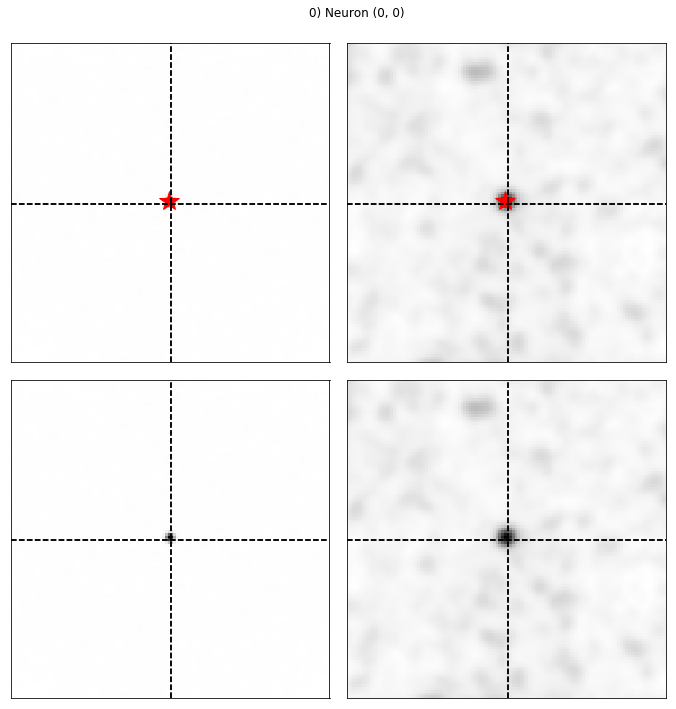

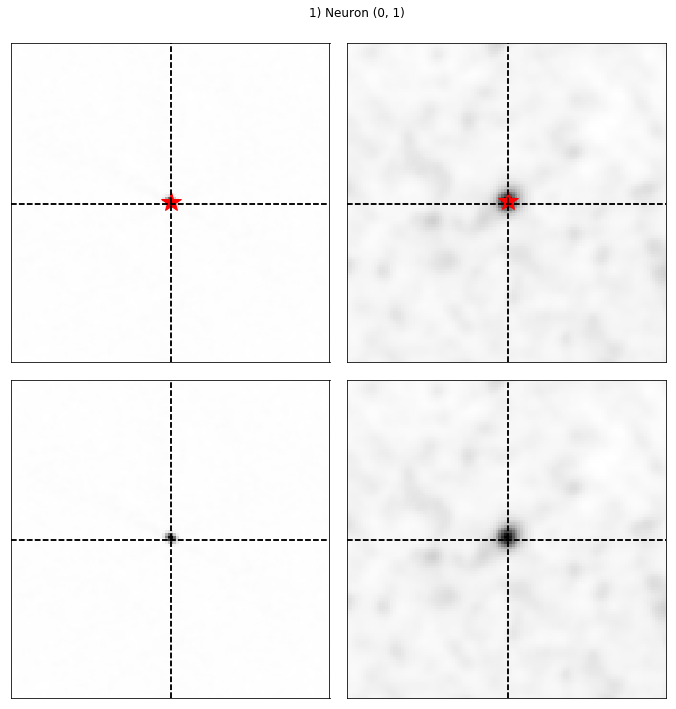

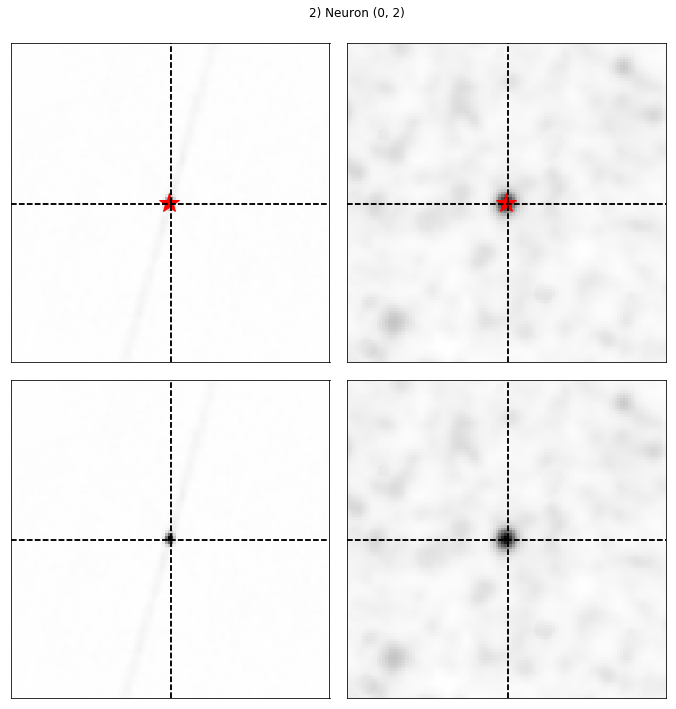

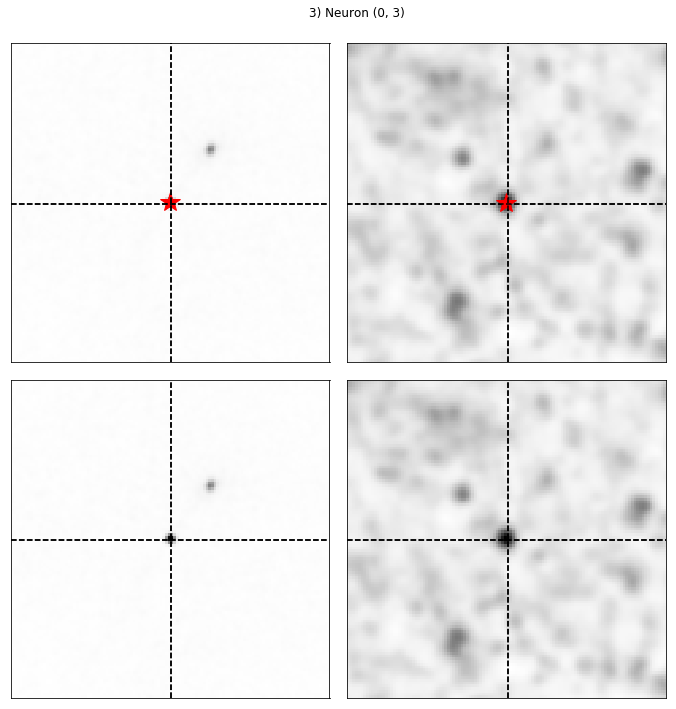

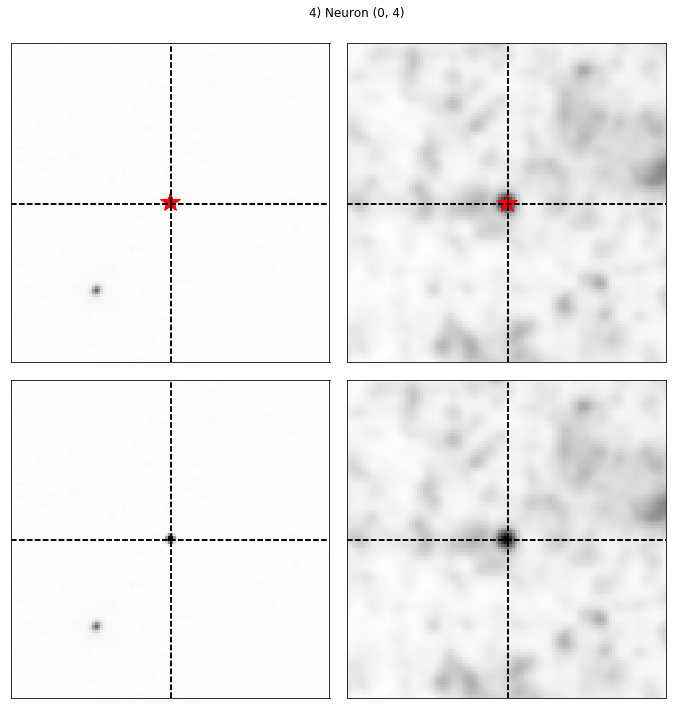

...

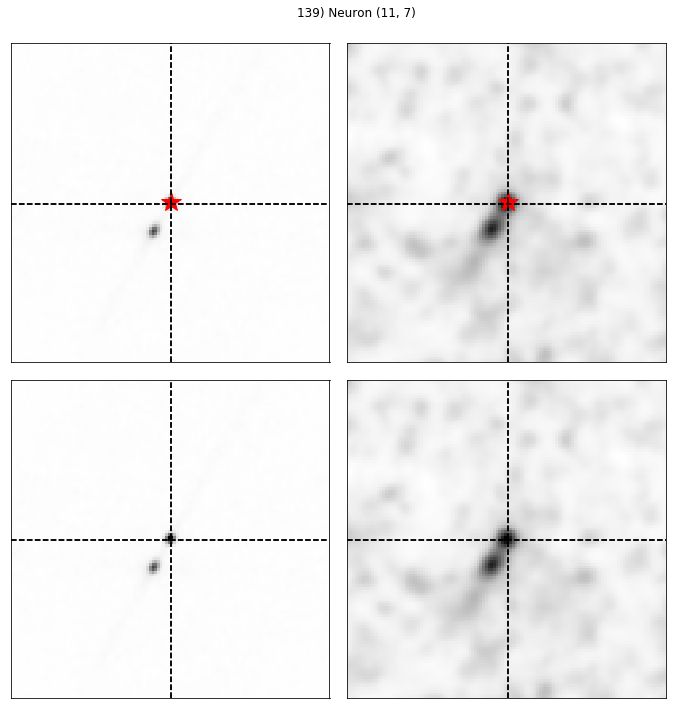

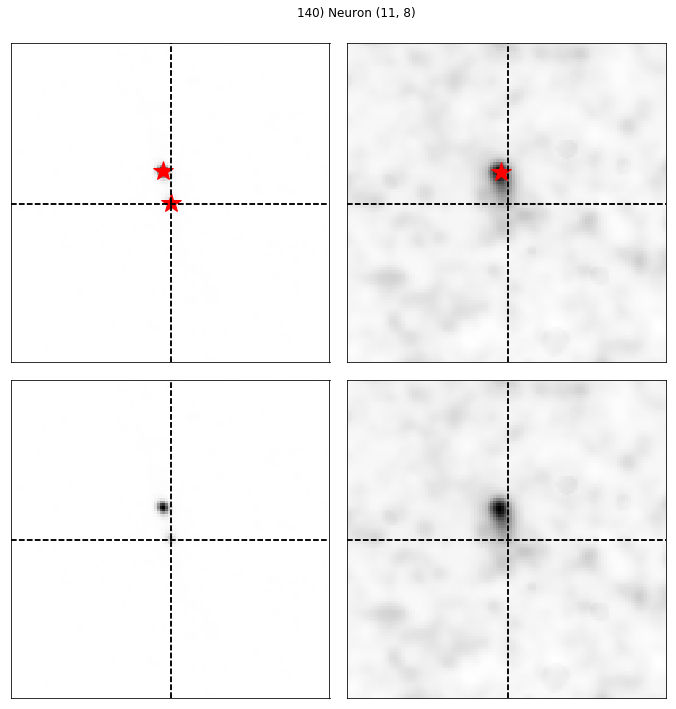

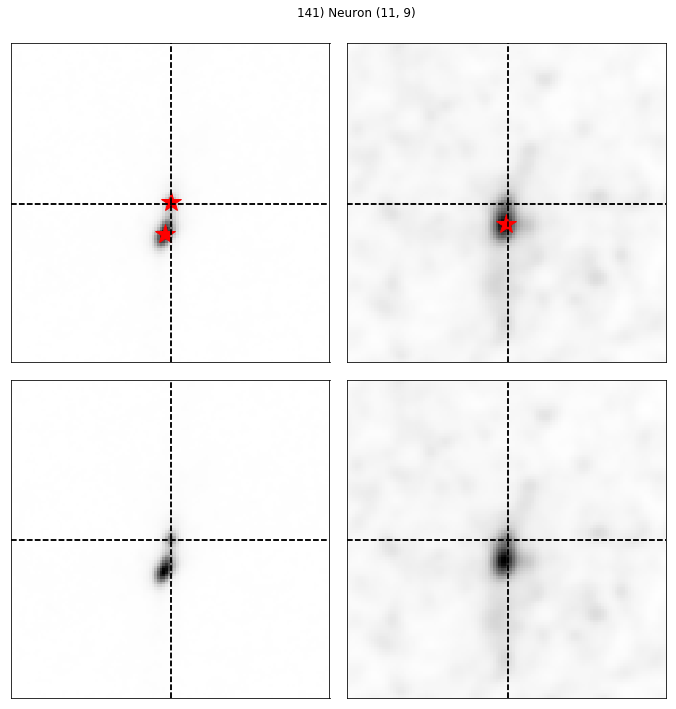

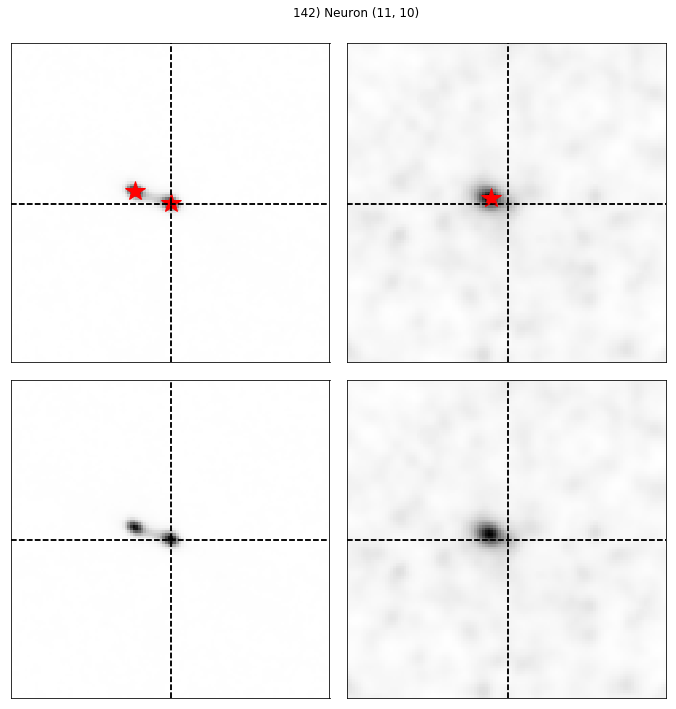

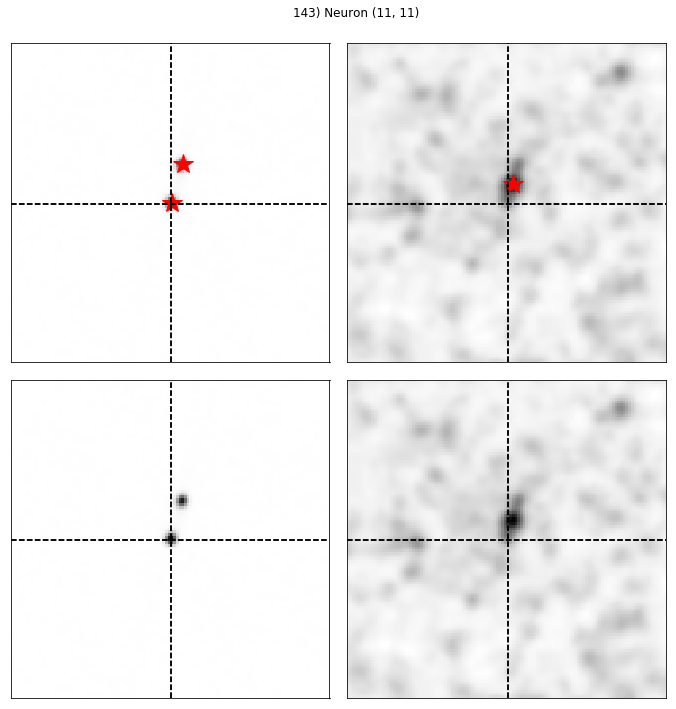

In [20]:
plt.close('all')
header = som.file_head

neurons = [(y,x) for y in range(header[1]) for x in range(header[2])]
cmap = 'Greys'

for count, (y, x) in enumerate(neurons):
    fig, ax = plt.subplots(2, header[0], figsize=(10,10))

    for c in range(header[0]):
        ant = annotations[(y,x,0)]

        img = ant.transform_neuron(None, channel=c)
        ax[0,c].imshow(img, cmap=cmap)
        ax[1,c].imshow(img, cmap=cmap)
        
        pu.no_ticks(ax[0,c])
        pu.no_ticks(ax[1,c])
        
        cen = np.array(img.shape) / 2

        clicks = np.array(ant.transform_clicks(None, channel=c))
        ax[0,c].plot(clicks[:,0]+cen[0], clicks[:,1]+cen[1], 'r*', ms=20)
    
        
        for a in ax.flat:
            a.axhline(cen[0], ls='--', color='black')
            a.axvline(cen[1], ls='--', color='black')
    
    fig.suptitle(f"{count}) Neuron {y, x}")
    fig.tight_layout(rect=[0,0,0.95,0.95])
    fig.savefig(f"Neuron_Overlay/{y}-{x}.png")
#     fig.show()

In [21]:
df        = pd.read_csv('../FIRST_F1W1_95_5_Sources.csv')



In [22]:
df.columns.tolist()

['Unnamed: 0',
 'Unnamed: 0.1',
 'Unnamed: 0.1.1',
 'RA',
 'DEC',
 'SIDEPROB',
 'FPEAK',
 'FINT',
 'RMS',
 'MAJOR',
 'MINOR',
 'POSANG',
 'FITTED_MAJOR',
 'FITTED_MINOR',
 'FITTED_POSANG',
 'FLDNAME',
 'NSDSS',
 'SDSS_SEP',
 'SDSS_MAG',
 'SDSS_CLASS',
 'NTMASS',
 'TMASS_SEP',
 'TMASS_MAG',
 'YEAR',
 'MJD',
 'MJDRMS',
 'MJDSTART',
 'MJDSTOP',
 'filename']